In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [9]:
data = pd.read_csv(r'../Final_data/SHP2_train_descriptors_2741.csv')
data

,SMILES,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,IC50(microM)
0,Cc1nc(cc(=O)n1-c1cccc(Cl)c1Cl)N1CCC2(Cc3ccccc3...,12.992564,-0.169513,12.992564,0.068072,0.609173,455.389,431.197,454.132717,160,...,0,0,0,0,0,0,0,0,0,0.0008
1,N[C@@H]1CCCC11CCN(CC1)c1cnc(Sc2cccc(NC(=O)c3c(...,13.061568,-0.781987,13.061568,0.246174,0.340043,597.145,563.881,596.208486,216,...,0,0,0,0,0,0,0,0,0,0.001
2,N[C@@H]1c2ccccc2CC11CCN(CC1)c1nc(N)c(C2=C(Cl)C...,12.340744,-0.676170,12.340744,0.017202,0.606557,485.419,459.211,484.154515,172,...,0,0,0,0,0,0,0,0,0,0.001
3,N[C@@H]1C[C@H](O)CC11CCN(CC1)c1ncc(Sc2cccc(Cl)...,10.063495,-0.264210,10.063495,0.058620,0.603375,464.422,441.238,463.100037,158,...,0,0,0,0,0,0,0,0,0,0.0012
4,C[C@@H]1OCC2(CCN(CC2)c2ncc(Sc3cccc(Cl)c3Cl)c3n...,6.464779,0.086398,6.464779,0.086398,0.614971,464.422,441.238,463.100037,158,...,0,0,0,0,0,0,0,0,0,0.0015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2736,CC(C)(C)c1ccc(Oc2ccc(NC(=O)C3=CO[C@@H](O[C@@H]...,13.333207,-1.619179,13.333207,0.045316,0.248676,597.661,558.349,597.257396,232,...,0,0,0,0,0,0,0,0,0,100.0
2737,O=C(O)C1=CO[C@@H](O[C@@H]2O[C@H](COCc3ccccc3)[...,12.516733,-1.051943,12.516733,0.156681,0.076526,824.967,772.551,824.356048,316,...,0,0,0,0,0,0,0,0,0,3.32
2738,CCOS(=O)(=O)/C=C/c1ccc(OCC2=CC[C@@H]3C(C(=O)Nc...,13.462705,-3.710843,13.462705,0.073907,0.112068,679.791,642.495,679.223988,252,...,0,0,0,0,0,0,0,0,0,1.24
2739,CCOS(=O)(=O)/C=C/c1ccc(OCC2=CC[C@@H]3C(C(=O)Nc...,13.659530,-3.730454,13.659530,0.066112,0.099496,793.132,757.852,791.095528,264,...,0,0,0,0,0,0,0,0,0,3.97


In [10]:
np.array(data.columns)

array(['SMILES', 'MaxEStateIndex', 'MinEStateIndex', 'MaxAbsEStateIndex',
       'MinAbsEStateIndex', 'qed', 'MolWt', 'HeavyAtomMolWt',
       'ExactMolWt', 'NumValenceElectrons', 'NumRadicalElectrons',
       'MaxPartialCharge', 'MinPartialCharge', 'MaxAbsPartialCharge',
       'MinAbsPartialCharge', 'FpDensityMorgan1', 'FpDensityMorgan2',
       'FpDensityMorgan3', 'BCUT2D_MWHI', 'BCUT2D_MWLOW', 'BCUT2D_CHGHI',
       'BCUT2D_CHGLO', 'BCUT2D_LOGPHI', 'BCUT2D_LOGPLOW', 'BCUT2D_MRHI',
       'BCUT2D_MRLOW', 'BalabanJ', 'BertzCT', 'Chi0', 'Chi0n', 'Chi0v',
       'Chi1', 'Chi1n', 'Chi1v', 'Chi2n', 'Chi2v', 'Chi3n', 'Chi3v',
       'Chi4n', 'Chi4v', 'HallKierAlpha', 'Ipc', 'Kappa1', 'Kappa2',
       'Kappa3', 'LabuteASA', 'PEOE_VSA1', 'PEOE_VSA10', 'PEOE_VSA11',
       'PEOE_VSA12', 'PEOE_VSA13', 'PEOE_VSA14', 'PEOE_VSA2', 'PEOE_VSA3',
       'PEOE_VSA4', 'PEOE_VSA5', 'PEOE_VSA6', 'PEOE_VSA7', 'PEOE_VSA8',
       'PEOE_VSA9', 'SMR_VSA1', 'SMR_VSA10', 'SMR_VSA2', 'SMR_VSA3',
       'SMR_V

In [11]:
def activity(s):
    if s[0] == '<':
        if float(s[1:]) <= 1:
            return 1
        else:
            return np.nan
    elif s[0] == '>':
        if float(s[1:]) >= 1:
            return 0
        else:
            return np.nan
    else:
        if float(s) > 1:
            return 0
        else:
            return 1

In [12]:
data['TARGET'] = data['IC50(microM)'].apply(activity)
data

,SMILES,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,IC50(microM),TARGET
0,Cc1nc(cc(=O)n1-c1cccc(Cl)c1Cl)N1CCC2(Cc3ccccc3...,12.992564,-0.169513,12.992564,0.068072,0.609173,455.389,431.197,454.132717,160,...,0,0,0,0,0,0,0,0,0.0008,1.0
1,N[C@@H]1CCCC11CCN(CC1)c1cnc(Sc2cccc(NC(=O)c3c(...,13.061568,-0.781987,13.061568,0.246174,0.340043,597.145,563.881,596.208486,216,...,0,0,0,0,0,0,0,0,0.001,1.0
2,N[C@@H]1c2ccccc2CC11CCN(CC1)c1nc(N)c(C2=C(Cl)C...,12.340744,-0.676170,12.340744,0.017202,0.606557,485.419,459.211,484.154515,172,...,0,0,0,0,0,0,0,0,0.001,1.0
3,N[C@@H]1C[C@H](O)CC11CCN(CC1)c1ncc(Sc2cccc(Cl)...,10.063495,-0.264210,10.063495,0.058620,0.603375,464.422,441.238,463.100037,158,...,0,0,0,0,0,0,0,0,0.0012,1.0
4,C[C@@H]1OCC2(CCN(CC2)c2ncc(Sc3cccc(Cl)c3Cl)c3n...,6.464779,0.086398,6.464779,0.086398,0.614971,464.422,441.238,463.100037,158,...,0,0,0,0,0,0,0,0,0.0015,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2736,CC(C)(C)c1ccc(Oc2ccc(NC(=O)C3=CO[C@@H](O[C@@H]...,13.333207,-1.619179,13.333207,0.045316,0.248676,597.661,558.349,597.257396,232,...,0,0,0,0,0,0,0,0,100.0,0.0
2737,O=C(O)C1=CO[C@@H](O[C@@H]2O[C@H](COCc3ccccc3)[...,12.516733,-1.051943,12.516733,0.156681,0.076526,824.967,772.551,824.356048,316,...,0,0,0,0,0,0,0,0,3.32,0.0
2738,CCOS(=O)(=O)/C=C/c1ccc(OCC2=CC[C@@H]3C(C(=O)Nc...,13.462705,-3.710843,13.462705,0.073907,0.112068,679.791,642.495,679.223988,252,...,0,0,0,0,0,0,0,0,1.24,0.0
2739,CCOS(=O)(=O)/C=C/c1ccc(OCC2=CC[C@@H]3C(C(=O)Nc...,13.659530,-3.730454,13.659530,0.066112,0.099496,793.132,757.852,791.095528,264,...,0,0,0,0,0,0,0,0,3.97,0.0


In [13]:
data['TARGET'] = data['TARGET'].apply(lambda x: 'Strong Inhibitor' if x==1.0 else 'Weak Inhibitor')
data

,SMILES,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,IC50(microM),TARGET
0,Cc1nc(cc(=O)n1-c1cccc(Cl)c1Cl)N1CCC2(Cc3ccccc3...,12.992564,-0.169513,12.992564,0.068072,0.609173,455.389,431.197,454.132717,160,...,0,0,0,0,0,0,0,0,0.0008,Strong Inhibitor
1,N[C@@H]1CCCC11CCN(CC1)c1cnc(Sc2cccc(NC(=O)c3c(...,13.061568,-0.781987,13.061568,0.246174,0.340043,597.145,563.881,596.208486,216,...,0,0,0,0,0,0,0,0,0.001,Strong Inhibitor
2,N[C@@H]1c2ccccc2CC11CCN(CC1)c1nc(N)c(C2=C(Cl)C...,12.340744,-0.676170,12.340744,0.017202,0.606557,485.419,459.211,484.154515,172,...,0,0,0,0,0,0,0,0,0.001,Strong Inhibitor
3,N[C@@H]1C[C@H](O)CC11CCN(CC1)c1ncc(Sc2cccc(Cl)...,10.063495,-0.264210,10.063495,0.058620,0.603375,464.422,441.238,463.100037,158,...,0,0,0,0,0,0,0,0,0.0012,Strong Inhibitor
4,C[C@@H]1OCC2(CCN(CC2)c2ncc(Sc3cccc(Cl)c3Cl)c3n...,6.464779,0.086398,6.464779,0.086398,0.614971,464.422,441.238,463.100037,158,...,0,0,0,0,0,0,0,0,0.0015,Strong Inhibitor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2736,CC(C)(C)c1ccc(Oc2ccc(NC(=O)C3=CO[C@@H](O[C@@H]...,13.333207,-1.619179,13.333207,0.045316,0.248676,597.661,558.349,597.257396,232,...,0,0,0,0,0,0,0,0,100.0,Weak Inhibitor
2737,O=C(O)C1=CO[C@@H](O[C@@H]2O[C@H](COCc3ccccc3)[...,12.516733,-1.051943,12.516733,0.156681,0.076526,824.967,772.551,824.356048,316,...,0,0,0,0,0,0,0,0,3.32,Weak Inhibitor
2738,CCOS(=O)(=O)/C=C/c1ccc(OCC2=CC[C@@H]3C(C(=O)Nc...,13.462705,-3.710843,13.462705,0.073907,0.112068,679.791,642.495,679.223988,252,...,0,0,0,0,0,0,0,0,1.24,Weak Inhibitor
2739,CCOS(=O)(=O)/C=C/c1ccc(OCC2=CC[C@@H]3C(C(=O)Nc...,13.659530,-3.730454,13.659530,0.066112,0.099496,793.132,757.852,791.095528,264,...,0,0,0,0,0,0,0,0,3.97,Weak Inhibitor


In [14]:
data['TARGET'].value_counts()

Weak Inhibitor      1773
Strong Inhibitor     968
Name: TARGET, dtype: int64

In [15]:
data = data.iloc[:,1:]
data

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,...,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,IC50(microM),TARGET
0,12.992564,-0.169513,12.992564,0.068072,0.609173,455.389,431.197,454.132717,160,0,...,0,0,0,0,0,0,0,0,0.0008,Strong Inhibitor
1,13.061568,-0.781987,13.061568,0.246174,0.340043,597.145,563.881,596.208486,216,0,...,0,0,0,0,0,0,0,0,0.001,Strong Inhibitor
2,12.340744,-0.676170,12.340744,0.017202,0.606557,485.419,459.211,484.154515,172,0,...,0,0,0,0,0,0,0,0,0.001,Strong Inhibitor
3,10.063495,-0.264210,10.063495,0.058620,0.603375,464.422,441.238,463.100037,158,0,...,0,0,0,0,0,0,0,0,0.0012,Strong Inhibitor
4,6.464779,0.086398,6.464779,0.086398,0.614971,464.422,441.238,463.100037,158,0,...,0,0,0,0,0,0,0,0,0.0015,Strong Inhibitor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2736,13.333207,-1.619179,13.333207,0.045316,0.248676,597.661,558.349,597.257396,232,0,...,0,0,0,0,0,0,0,0,100.0,Weak Inhibitor
2737,12.516733,-1.051943,12.516733,0.156681,0.076526,824.967,772.551,824.356048,316,0,...,0,0,0,0,0,0,0,0,3.32,Weak Inhibitor
2738,13.462705,-3.710843,13.462705,0.073907,0.112068,679.791,642.495,679.223988,252,0,...,0,0,0,0,0,0,0,0,1.24,Weak Inhibitor
2739,13.659530,-3.730454,13.659530,0.066112,0.099496,793.132,757.852,791.095528,264,0,...,0,0,0,0,0,0,0,0,3.97,Weak Inhibitor


In [16]:
def count_numbers(label, descriptor):
    strong = data[data['TARGET'] == label]
    print(strong[descriptor].value_counts())

# Ring count

In [17]:
data['RingCount'].value_counts()

4     859
3     698
5     526
2     262
6     248
7      65
1      46
8      17
9       8
0       8
12      4
Name: RingCount, dtype: int64

E:\MY_FILES\Anaconda\envs\thesis\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


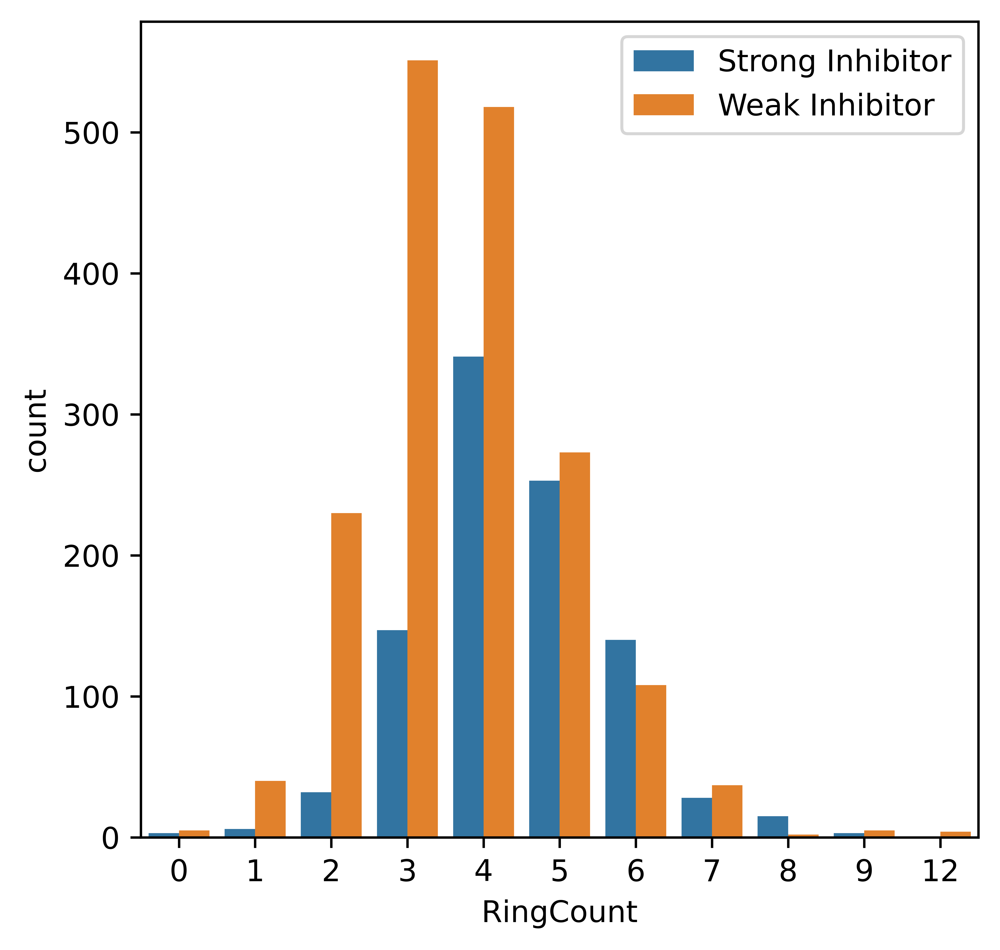

In [18]:
plt.figure(figsize=(5,5), dpi=1200)
sns.countplot(data['RingCount'], hue=data['TARGET'])
plt.legend(loc='upper right')

In [19]:
count_numbers('Strong Inhibitor','RingCount')

4    341
5    253
3    147
6    140
2     32
7     28
8     15
1      6
9      3
0      3
Name: RingCount, dtype: int64


In [20]:
count_numbers('Weak Inhibitor','RingCount')

3     551
4     518
5     273
2     230
6     108
1      40
7      37
9       5
0       5
12      4
8       2
Name: RingCount, dtype: int64


# NumAliphaticRings

E:\MY_FILES\Anaconda\envs\thesis\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


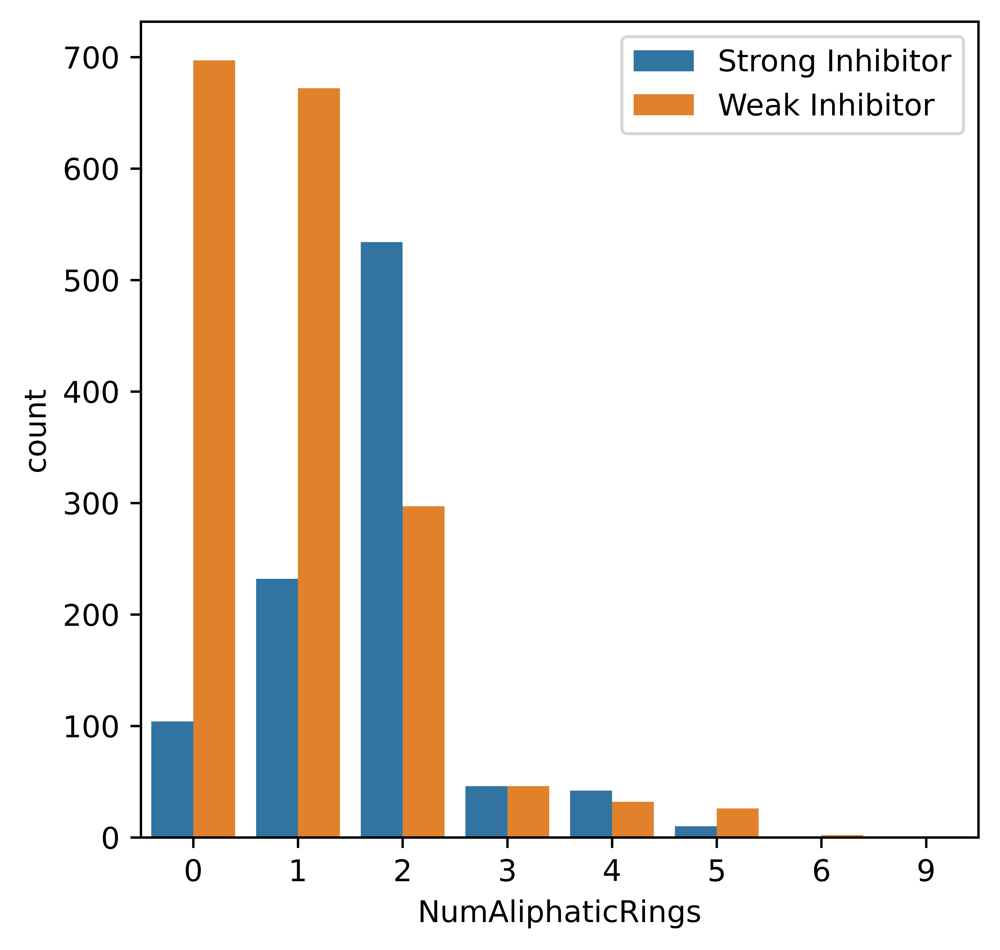

In [21]:
plt.figure(figsize=(5,5), dpi=1200)
sns.countplot(data['NumAliphaticRings'], hue=data['TARGET'])
plt.legend(loc='upper right')

# NumAromaticRings

In [26]:
def plot_chart(column):
    plt.figure(figsize=(5,5), dpi=1200)
    sns.countplot(data[column], hue=data['TARGET'])
    plt.legend(loc='upper right')

In [22]:
eda_columns = [['RingCount', 'NumAliphaticRings', 'NumAromaticRings'],
       ['NumSaturatedRings', 'NumAliphaticCarbocycles', 'NumAromaticCarbocycles'],
       ['NumSaturatedCarbocycles', 'NumAliphaticHeterocycles',
               'NumAromaticHeterocycles'],  
        ['NumSaturatedHeterocycles', 'NumHAcceptors', 'NumHDonors'] 
        ]

In [23]:
len(eda_columns)

4

E:\MY_FILES\Anaconda\envs\thesis\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
E:\MY_FILES\Anaconda\envs\thesis\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
E:\MY_FILES\Anaconda\envs\thesis\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
E:\MY_FILE

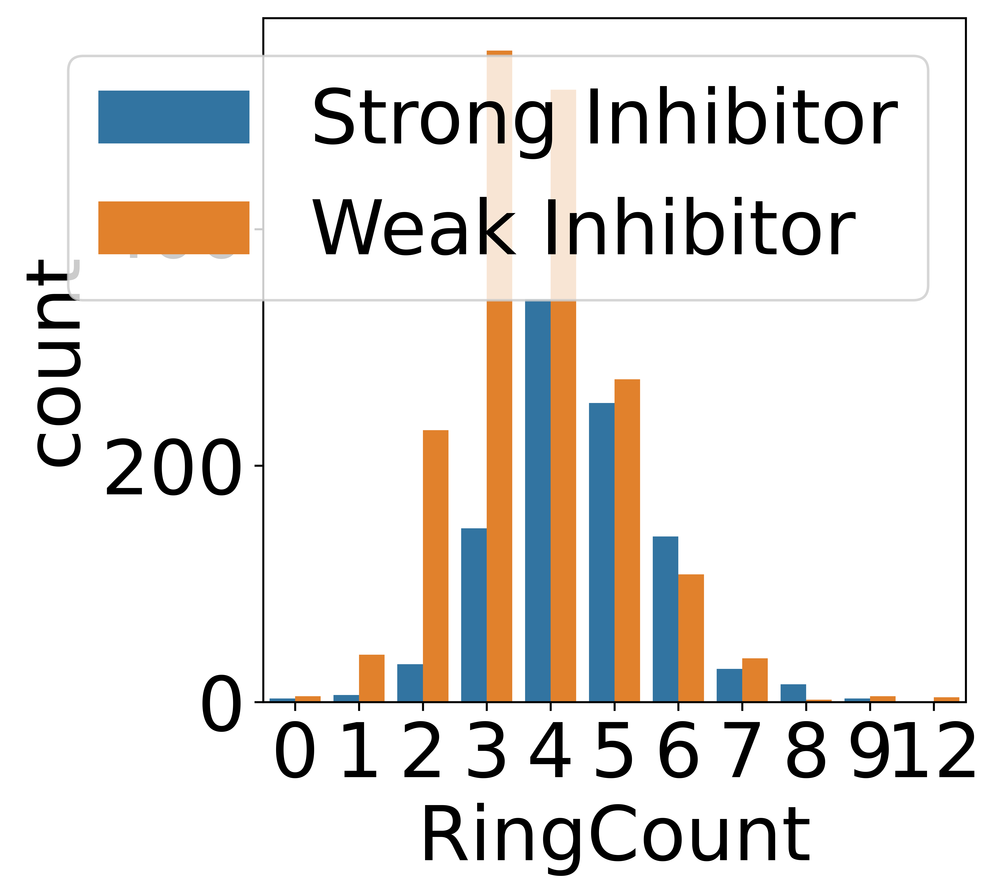

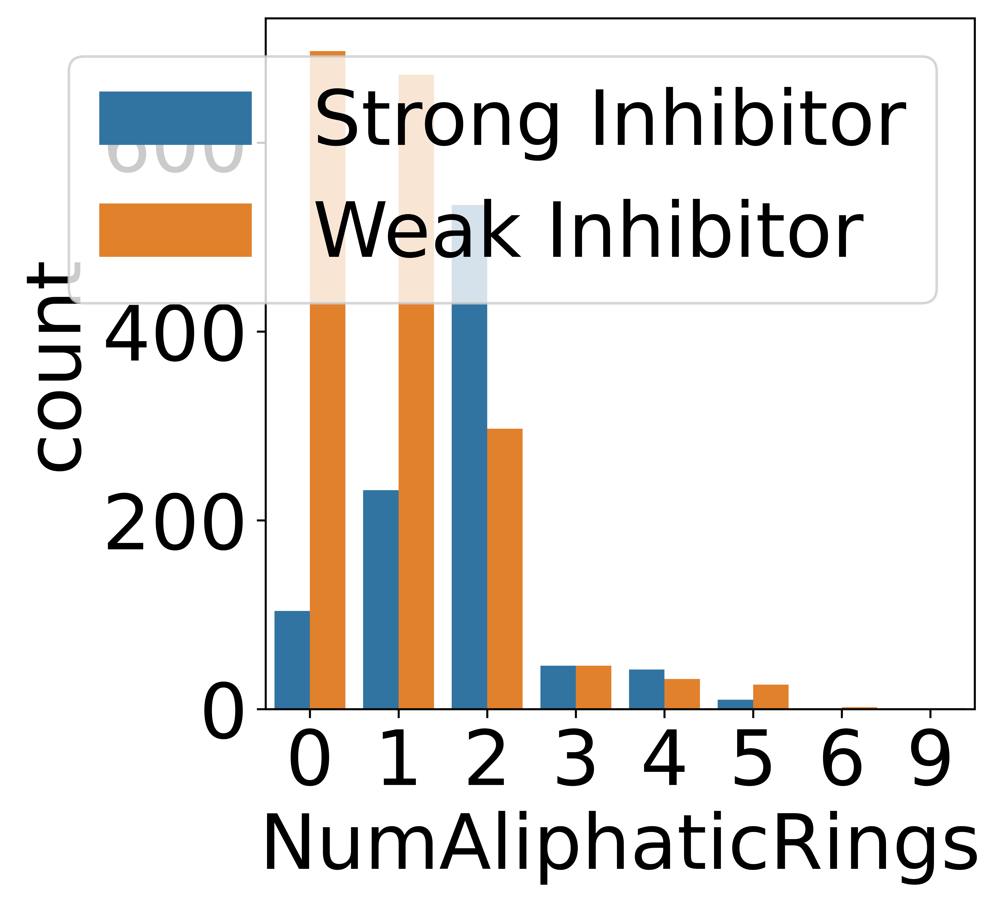

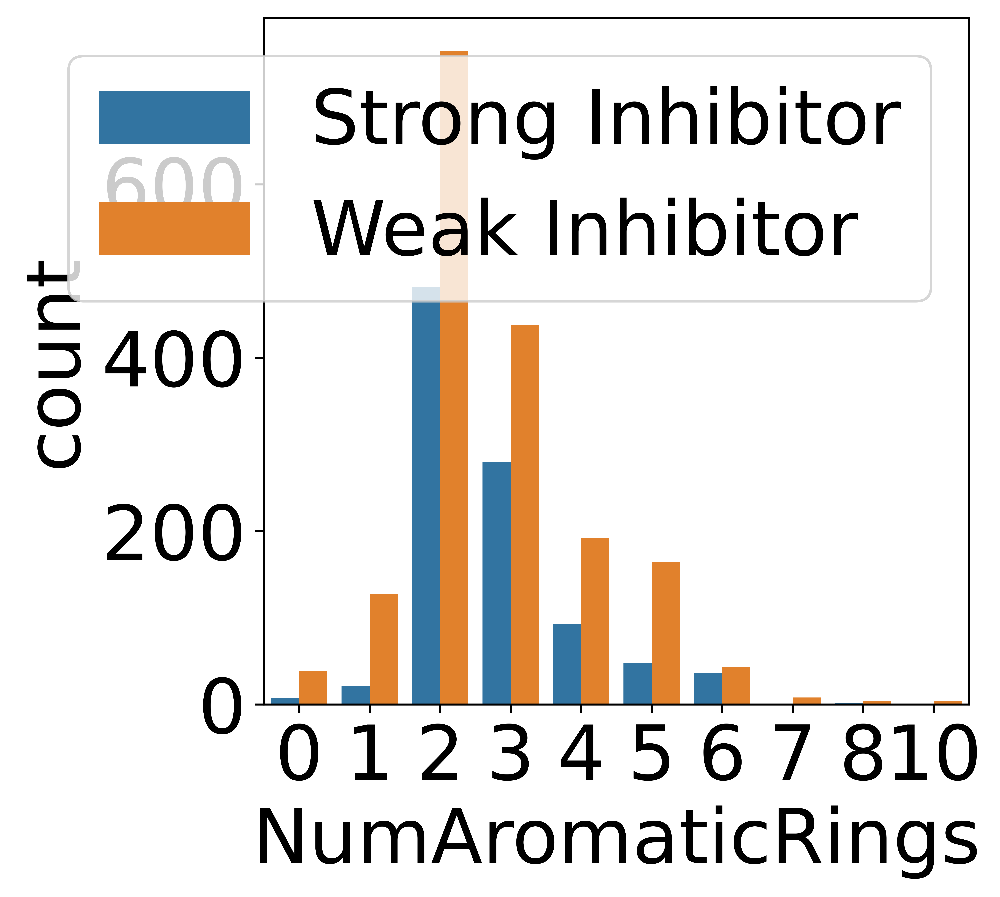

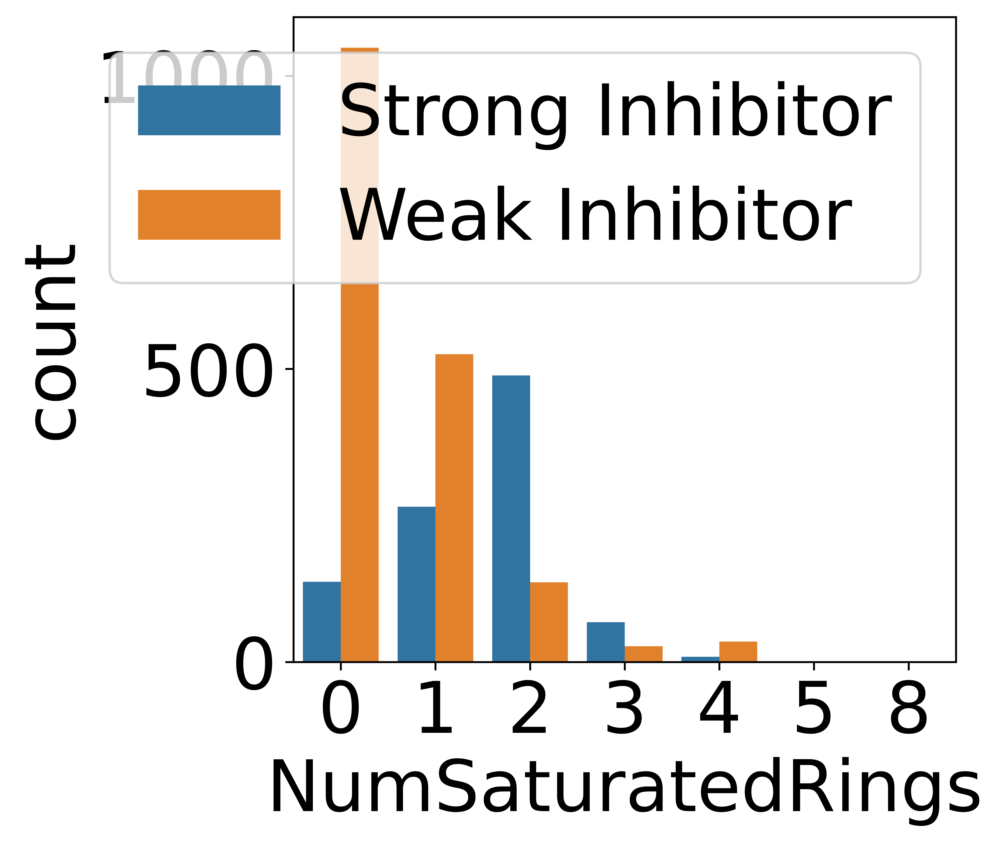

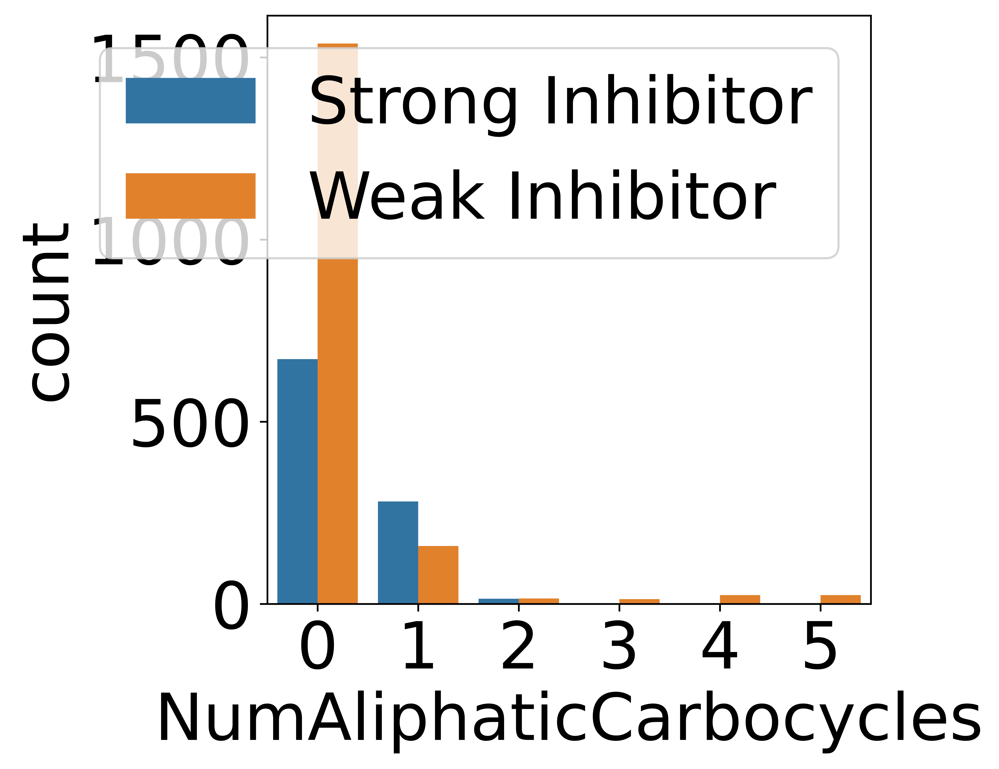

...

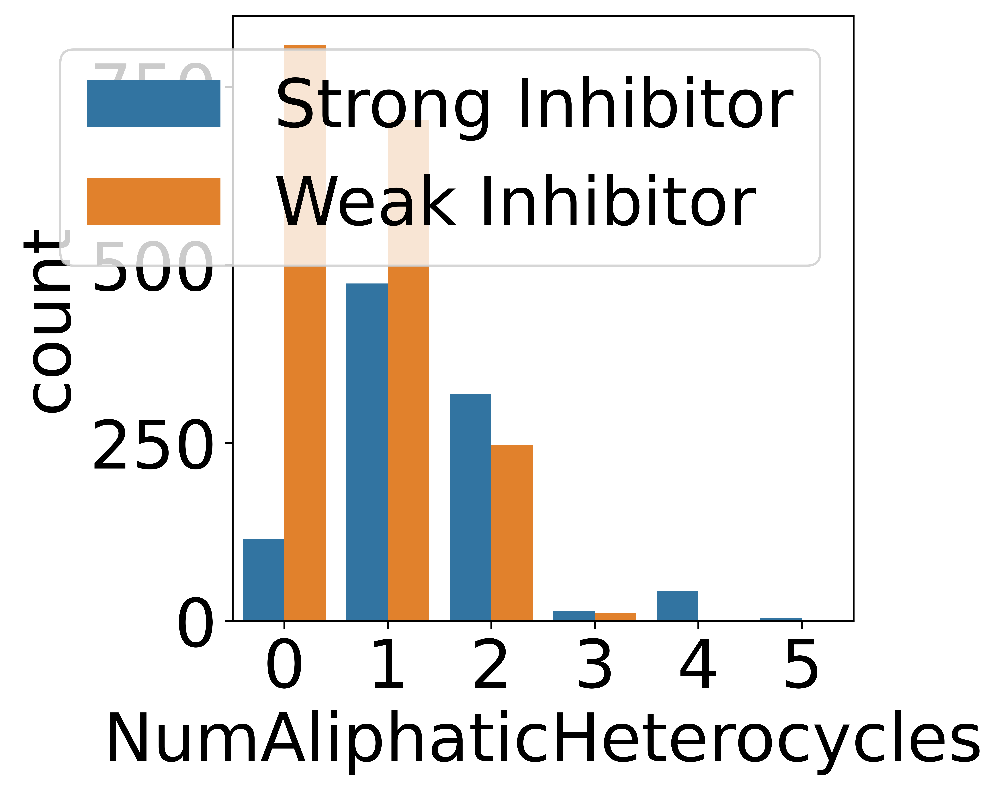

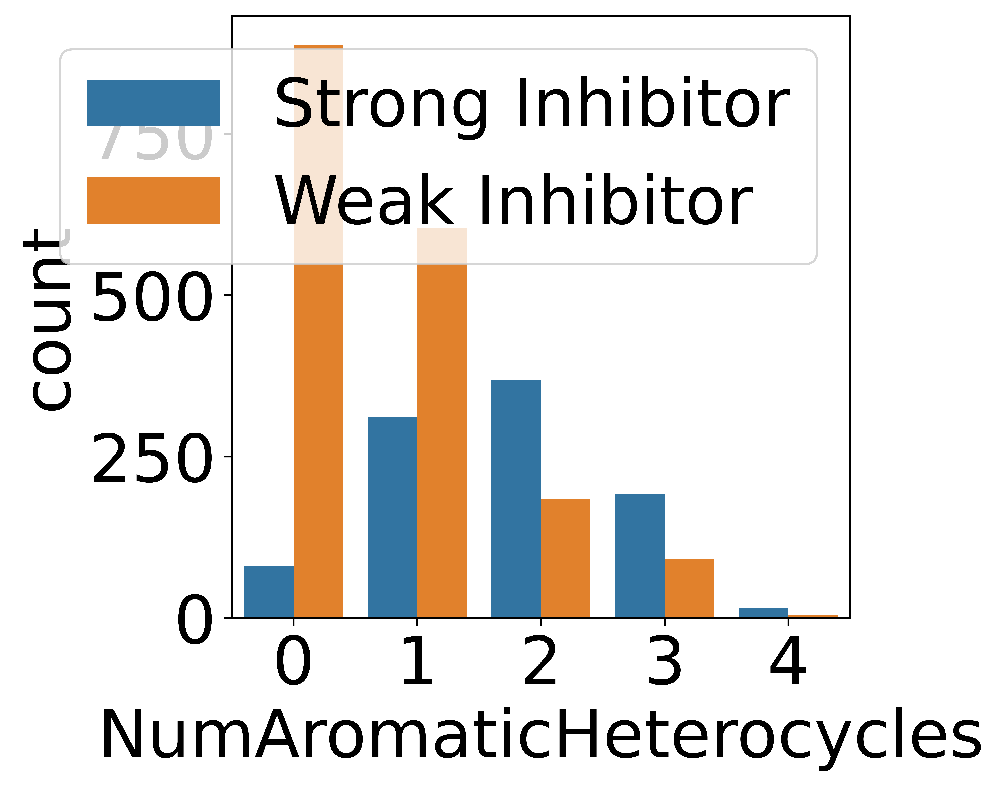

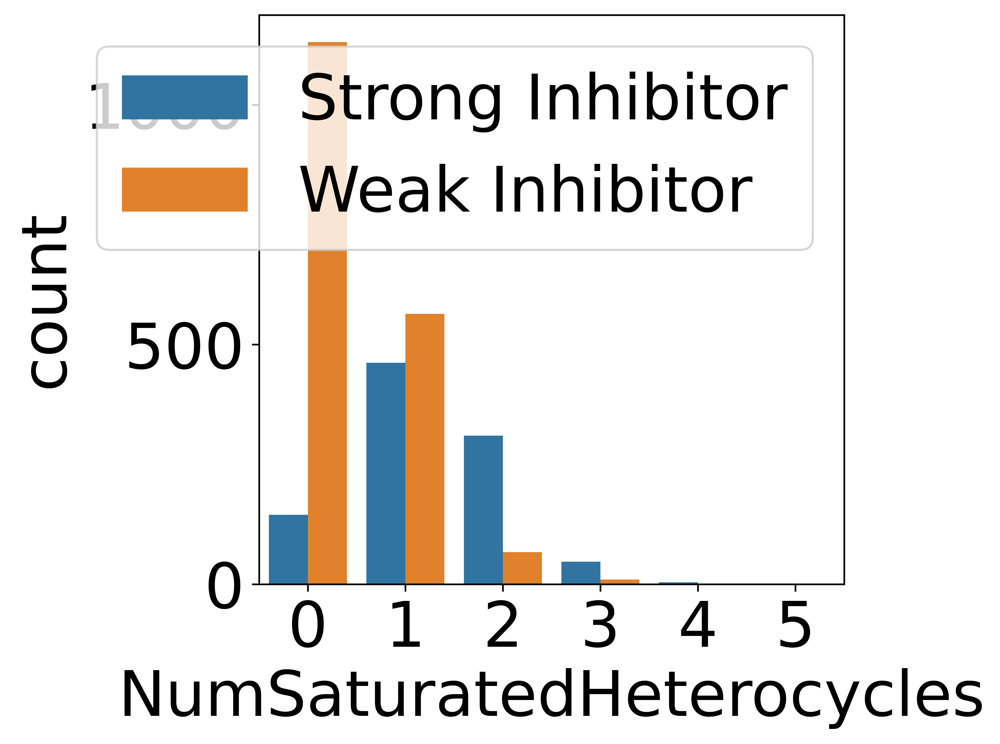

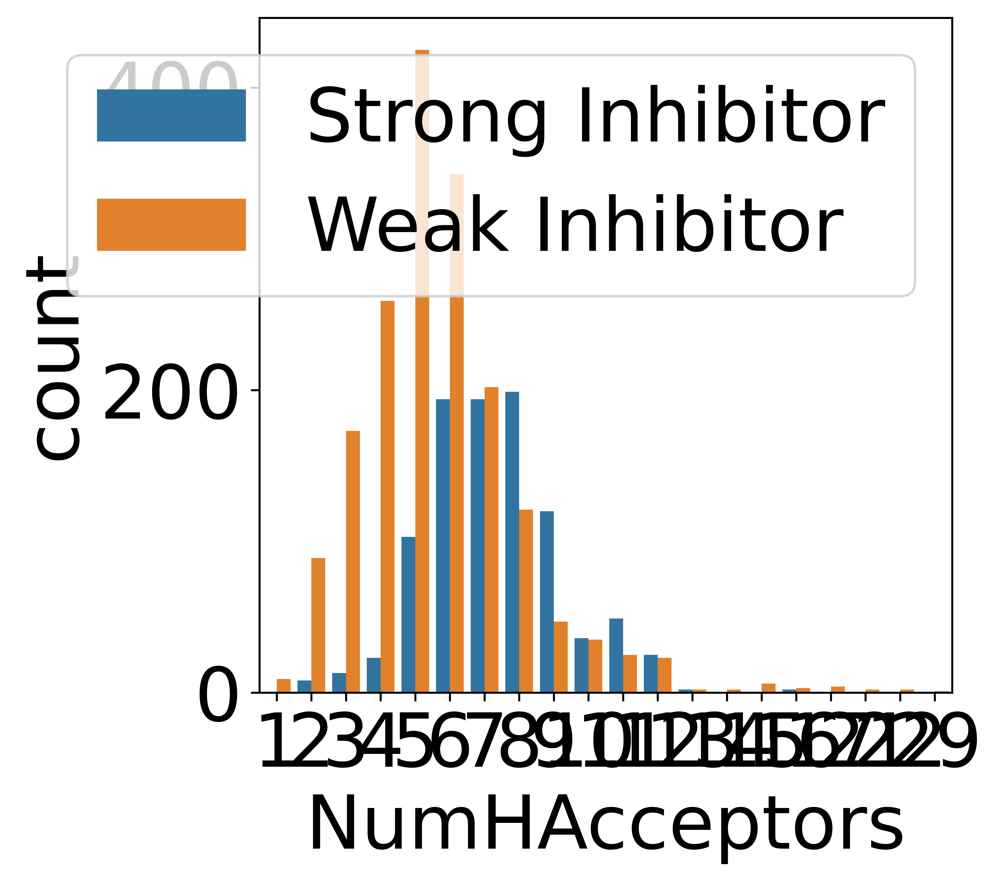

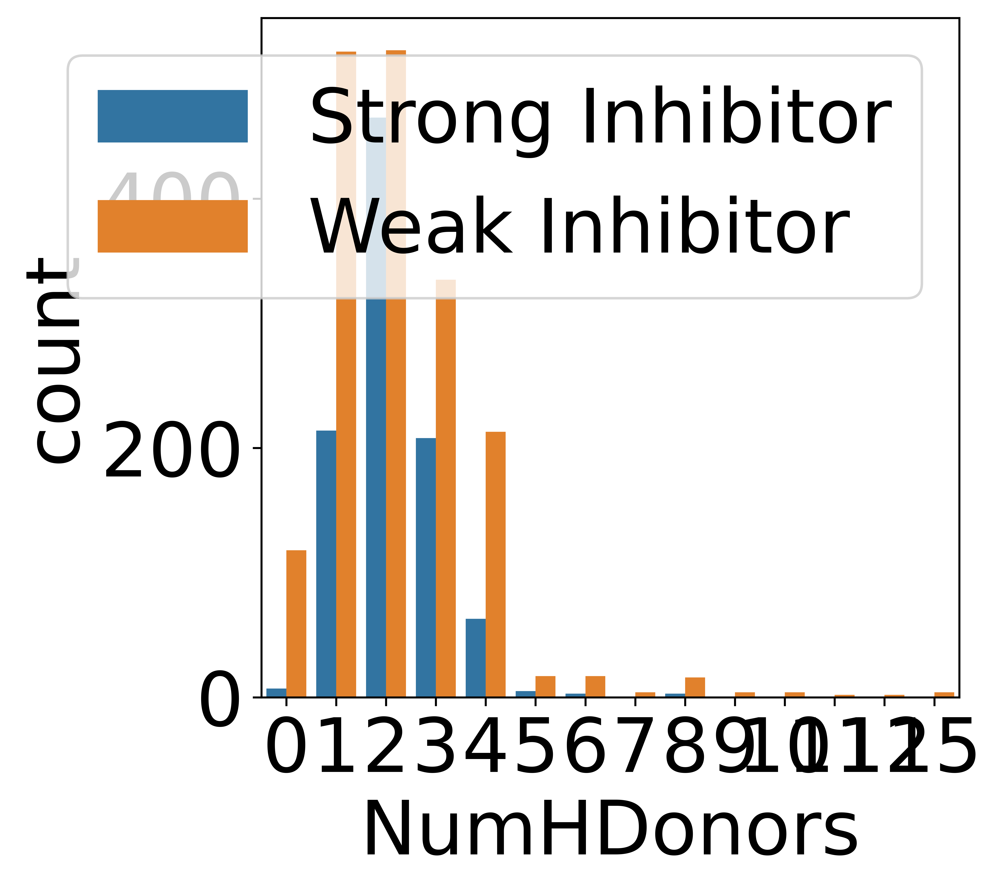

In [29]:
for rows in eda_columns:
    for cols in rows:
        #print(cols)
        plot_chart(cols)

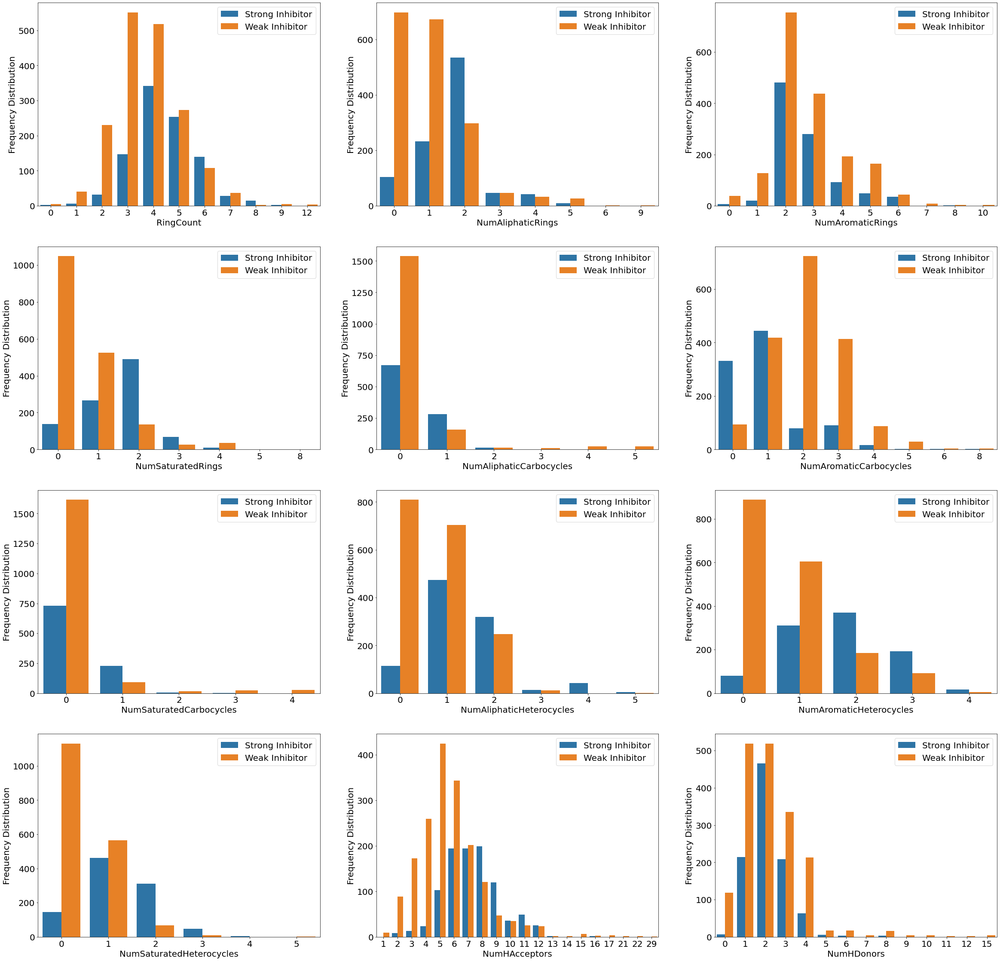

In [25]:
fig, axes = plt.subplots(4, 3, figsize=(40, 40))



for r in range(4):
    for c in range(3):
        sns.countplot(ax=axes[r, c], x = data[eda_columns[r][c]], hue=data['TARGET'], saturation=0.8)
        #axes[r, c].rc('font', {'font.size': 20})
        axes[r, c].legend(loc='upper right', fontsize = 20.0)
        axes[r, c].set_ylabel('Frequency Distribution', fontsize = 20.0)
        axes[r, c].set_xlabel(eda_columns[r][c], fontsize = 20.0)
        
plt.rcParams.update({'font.size': 30})
fig.savefig('Structural_descriptors_eda.png')

In [34]:
eda_columns_properties = [
    ['qed','TPSA','FractionCSP3'],
    ['MolWt','MolLogP','MolMR']
]

In [39]:
eda_columns_properties[1][0]

'MolWt'

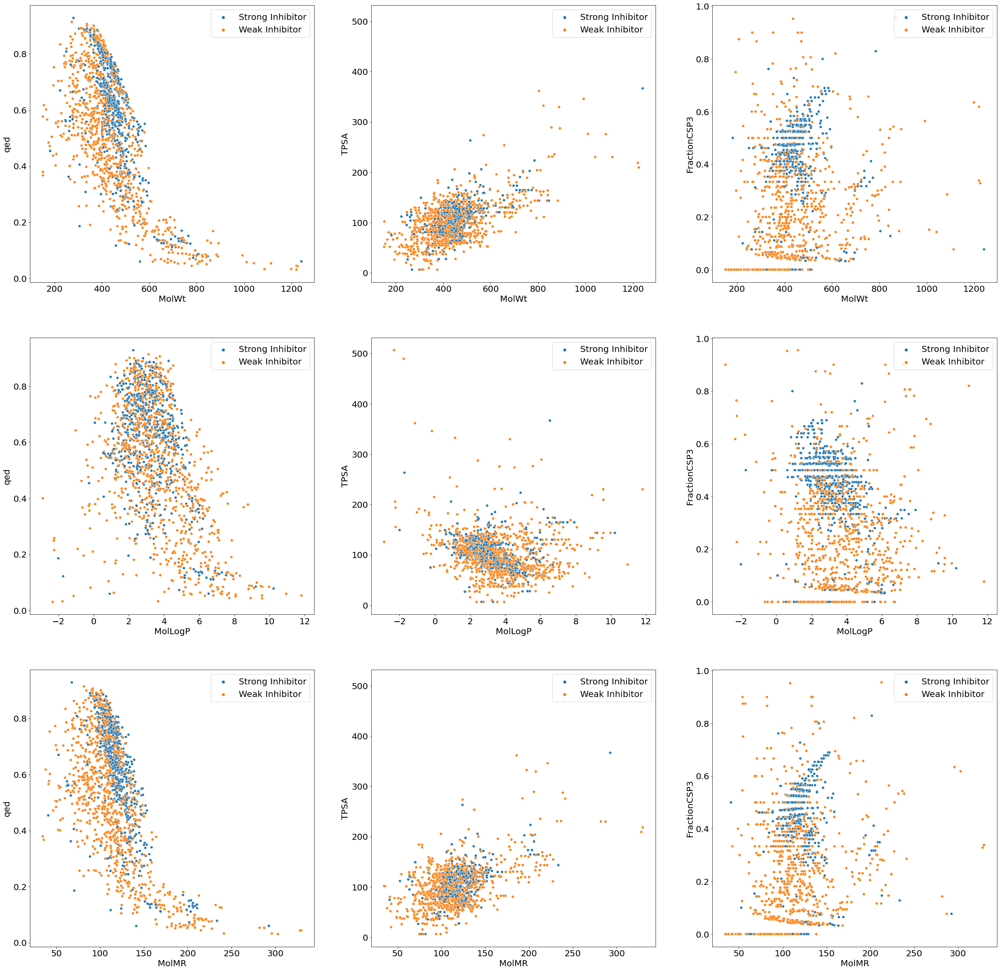

In [41]:
fig, axes = plt.subplots(3, 3, figsize=(40, 40))

plt.rcParams['font.size'] = '20'

for c in range(3):
    
    sns.scatterplot(ax=axes[0, c], x = data[eda_columns_properties[1][0]], y = data[eda_columns_properties[0][c]], hue=data['TARGET'])
    #axes[r, c].rc('font', {'font.size': 20})
    axes[0, c].legend(loc='upper right', fontsize = 20.0)
    axes[0, c].set_ylabel(eda_columns_properties[0][c], fontsize = 20.0)
    axes[0, c].set_xlabel(eda_columns_properties[1][0], fontsize = 20.0)

    sns.scatterplot(ax=axes[1, c], x = data[eda_columns_properties[1][1]], y = data[eda_columns_properties[0][c]], hue=data['TARGET'])
    #axes[r, c].rc('font', {'font.size': 20})
    axes[1, c].legend(loc='upper right', fontsize = 20.0)
    axes[1, c].set_ylabel(eda_columns_properties[0][c], fontsize = 20.0)
    axes[1, c].set_xlabel(eda_columns_properties[1][1], fontsize = 20.0)

    sns.scatterplot(ax=axes[2, c], x = data[eda_columns_properties[1][2]], y = data[eda_columns_properties[0][c]], hue=data['TARGET'])
    #axes[r, c].rc('font', {'font.size': 20}
    axes[2, c].legend(loc='upper right', fontsize = 20.0)
    axes[2, c].set_ylabel(eda_columns_properties[0][c], fontsize = 20.0)
    axes[2, c].set_xlabel(eda_columns_properties[1][2], fontsize = 20.0)
        

fig.savefig('Property_descriptors_eda.png')

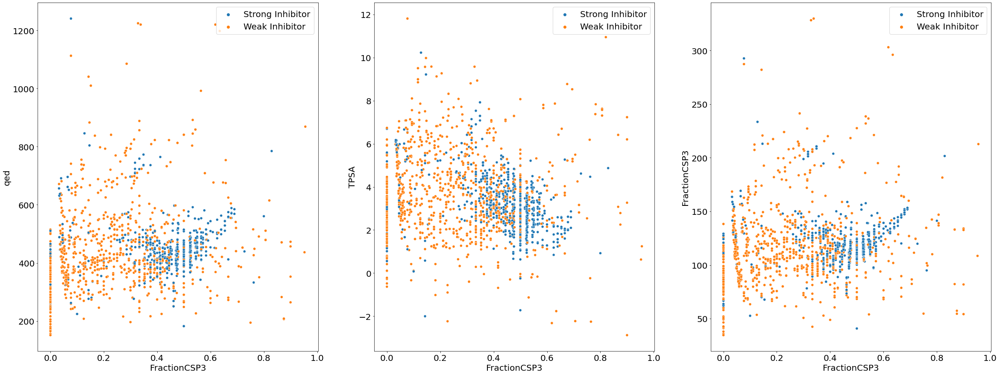

In [51]:
fig, axes = plt.subplots(1, 3, figsize=(40, 15))

plt.rcParams['font.size'] = '20'

for c in range(3):
    
    sns.scatterplot(ax=axes[c], x = data[eda_columns_properties[0][2]], y = data[eda_columns_properties[1][c]], hue=data['TARGET'])
    #axes[r, c].rc('font', {'font.size': 20})
    axes[c].legend(loc='upper right', fontsize = 20.0)
    axes[c].set_ylabel(eda_columns_properties[0][c], fontsize = 20.0)
    axes[c].set_xlabel(eda_columns_properties[0][2], fontsize = 20.0)

        

fig.savefig('fractioncsp3_descriptors_eda.png')

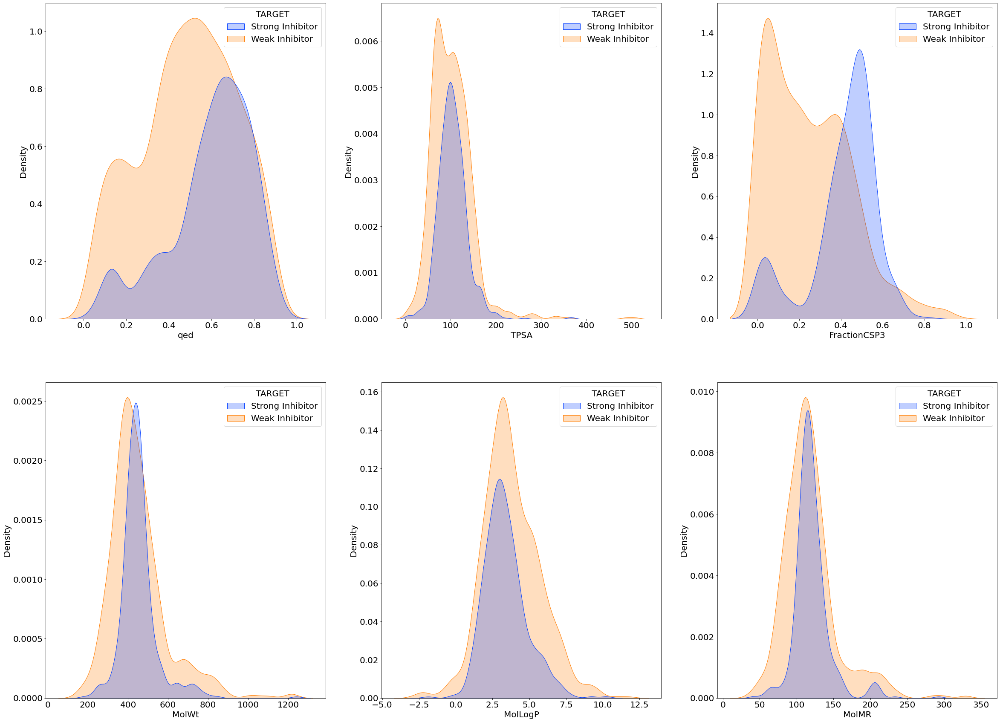

In [61]:
fig, axes = plt.subplots(2, 3, figsize=(40, 30))

plt.rcParams['font.size'] = '20'

for r in range(2):
    for c in range(3):
        sns.kdeplot(ax=axes[r, c], data=data, x=eda_columns_properties[r][c], hue='TARGET', fill=True, palette=sns.color_palette('bright')[:2])
        #axes[r, c].rc('font', {'font.size': 20})
        #axes[r, c].legend(loc='upper right', fontsize = 20.0)
        axes[r, c].set_ylabel('Density', fontsize = 20.0)
        axes[r, c].set_xlabel(eda_columns_properties[r][c], fontsize = 20.0)

fig.savefig('property_distributions_eda.png')

In [68]:
vsa_descriptors = [['PEOE_VSA12', 'PEOE_VSA6', 'SMR_VSA3'], ['SlogP_VSA3', 'SlogP_VSA8', 'EState_VSA6']]

In [73]:
selected_descriptors = [['MaxPartialCharge', 'FpDensityMorgan2'], ['BCUT2D_CHGLO', 'BCUT2D_MRHI']]

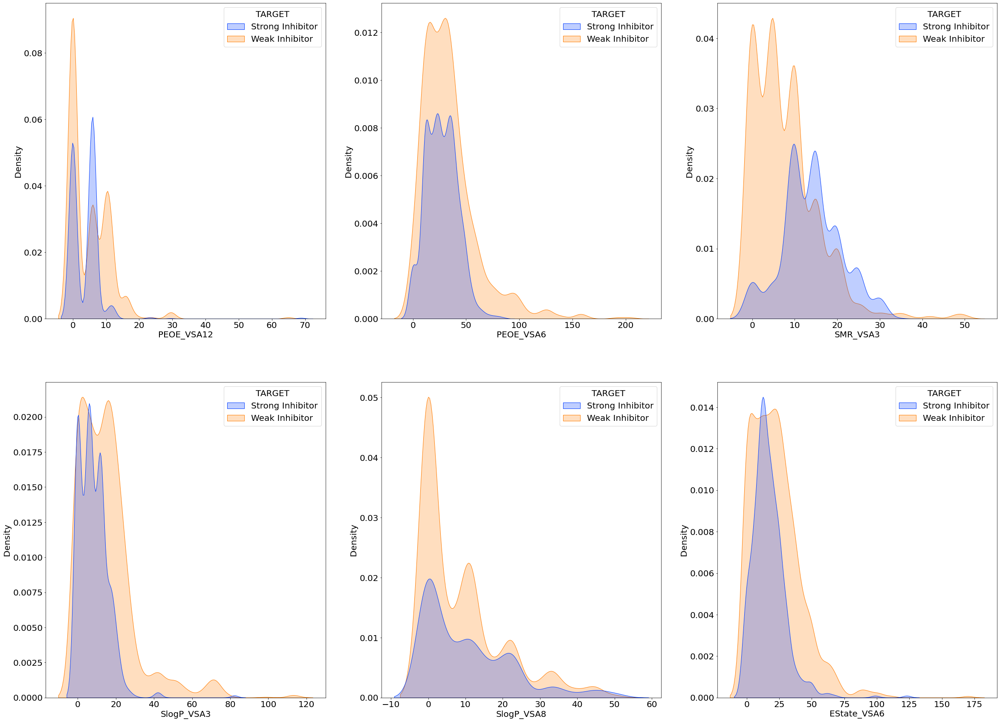

In [76]:
fig, axes = plt.subplots(2, 3, figsize=(40, 30))

plt.rcParams['font.size'] = '20'

for r in range(2):
    for c in range(3):
        sns.kdeplot(ax=axes[r, c], data=data, x=vsa_descriptors[r][c], hue='TARGET', fill=True, palette=sns.color_palette('bright')[:2])
        #axes[r, c].rc('font', {'font.size': 20})
        #axes[r, c].legend(loc='upper right', fontsize = 20.0)
        axes[r, c].set_ylabel('Density', fontsize = 20.0)
        axes[r, c].set_xlabel(vsa_descriptors[r][c], fontsize = 20.0)

fig.savefig('vsa_distributions_eda.png')

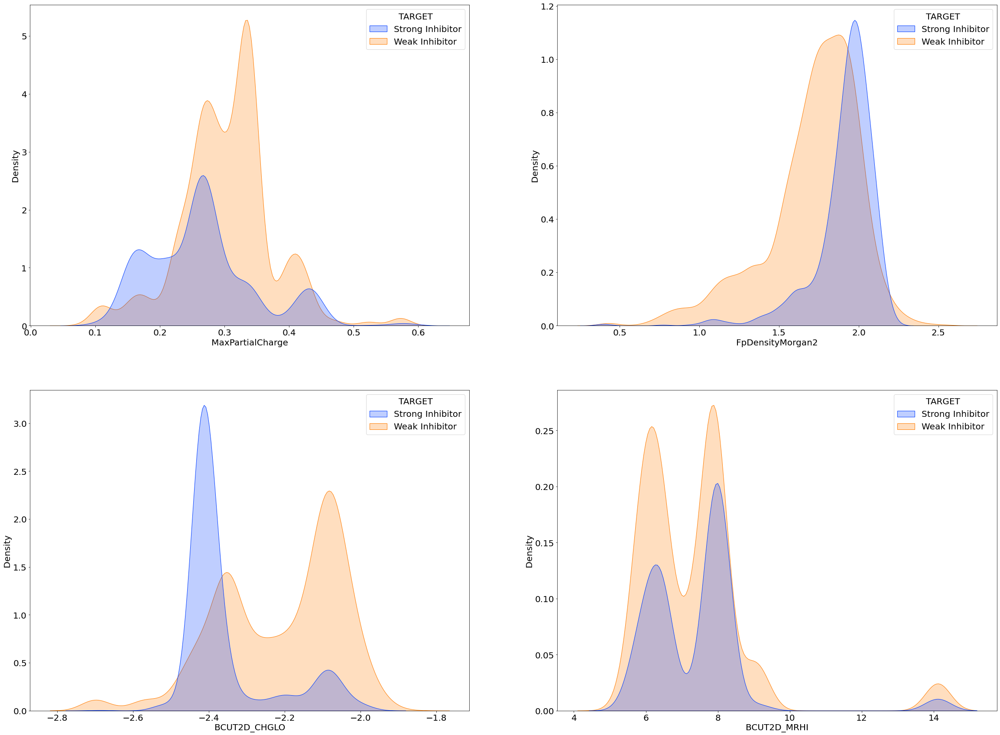

In [75]:
fig, axes = plt.subplots(2, 2, figsize=(40, 30))

plt.rcParams['font.size'] = '20'

for r in range(2):
    for c in range(2):
        sns.kdeplot(ax=axes[r, c], data=data, x=selected_descriptors[r][c], hue='TARGET', fill=True, palette=sns.color_palette('bright')[:2])
        #axes[r, c].rc('font', {'font.size': 20})
        #axes[r, c].legend(loc='upper right', fontsize = 20.0)
        axes[r, c].set_ylabel('Density', fontsize = 20.0)
        axes[r, c].set_xlabel(selected_descriptors[r][c], fontsize = 20.0)

fig.savefig('other_selected_distributions_eda.png')

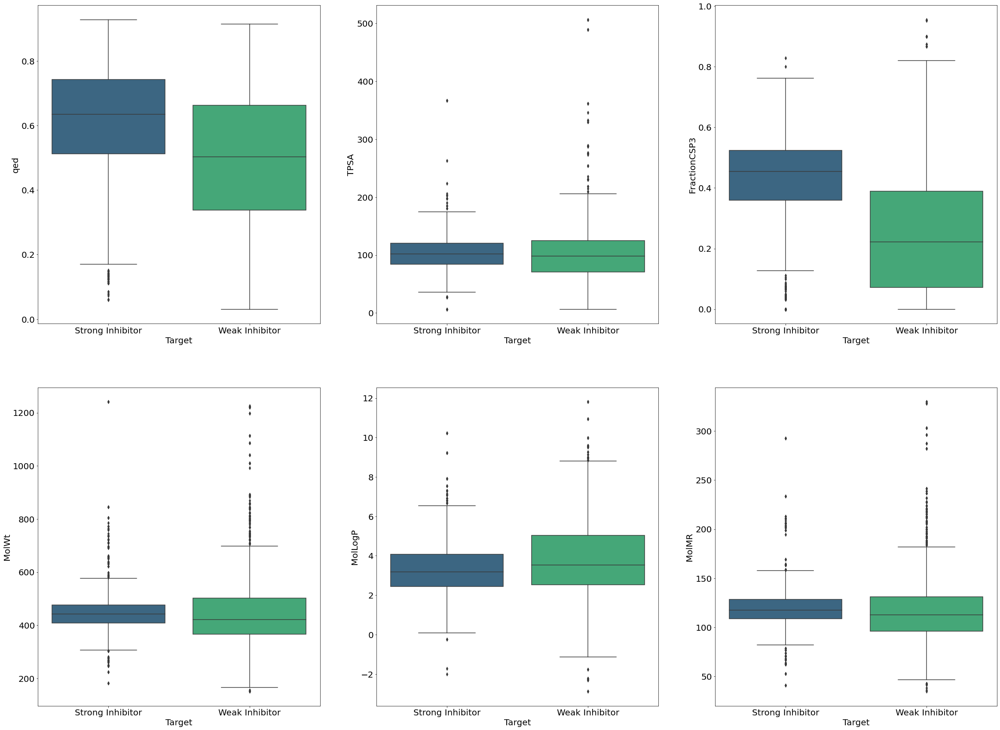

In [79]:
fig, axes = plt.subplots(2, 3, figsize=(40, 30))

plt.rcParams['font.size'] = '20'

for r in range(2):
    for c in range(3):
        sns.boxplot(ax=axes[r, c], data=data, y=eda_columns_properties[r][c], x ='TARGET', palette='viridis')
        #axes[r, c].rc('font', {'font.size': 20})
        #axes[r, c].legend(loc='upper right', fontsize = 20.0)
        axes[r, c].set_ylabel(eda_columns_properties[r][c], fontsize = 20.0)
        axes[r, c].set_xlabel('Target', fontsize = 20.0)

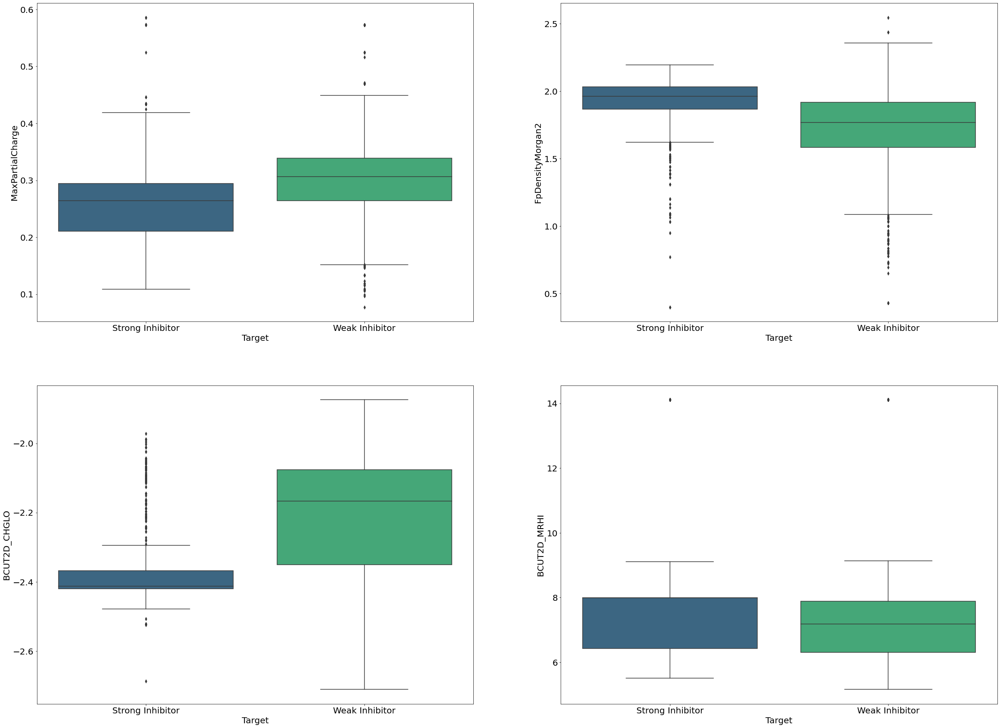

In [80]:
fig, axes = plt.subplots(2, 2, figsize=(40, 30))

plt.rcParams['font.size'] = '20'

for r in range(2):
    for c in range(2):
        sns.boxplot(ax=axes[r, c], data=data, y=selected_descriptors[r][c], x='TARGET', palette='viridis')
        #axes[r, c].rc('font', {'font.size': 20})
        #axes[r, c].legend(loc='upper right', fontsize = 20.0)
        axes[r, c].set_ylabel(selected_descriptors[r][c], fontsize = 20.0)
        axes[r, c].set_xlabel('Target', fontsize = 20.0)

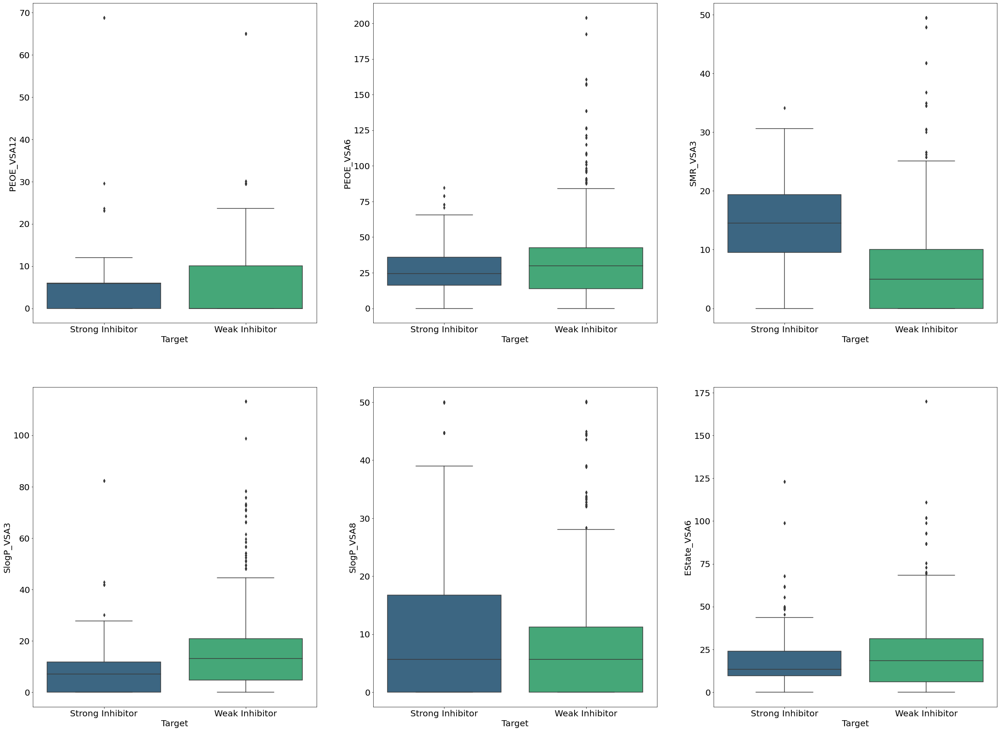

In [82]:
fig, axes = plt.subplots(2, 3, figsize=(40, 30))

plt.rcParams['font.size'] = '20'

for r in range(2):
    for c in range(3):
        sns.boxplot(ax=axes[r, c], data=data, y=vsa_descriptors[r][c], x='TARGET', palette='viridis')
        #axes[r, c].rc('font', {'font.size': 20})
        #axes[r, c].legend(loc='upper right', fontsize = 20.0)
        axes[r, c].set_ylabel(vsa_descriptors[r][c], fontsize = 20.0)
        axes[r, c].set_xlabel('Target', fontsize = 20.0)

In [83]:
new_columns = ['MaxEStateIndex', 'MinEStateIndex', 'MaxAbsEStateIndex',
       'MinAbsEStateIndex', 'qed', 'MolWt', 'HeavyAtomMolWt',
       'ExactMolWt',
       'MaxPartialCharge', 'MinPartialCharge', 'MaxAbsPartialCharge',
       'MinAbsPartialCharge', 'FpDensityMorgan1', 'FpDensityMorgan2',
       'FpDensityMorgan3', 'BCUT2D_MWHI', 'BCUT2D_MWLOW', 'BCUT2D_CHGHI',
       'BCUT2D_CHGLO', 'BCUT2D_LOGPHI', 'BCUT2D_LOGPLOW', 'BCUT2D_MRHI',
       'BCUT2D_MRLOW', 'BalabanJ', 'BertzCT', 'Chi0', 'Chi0n', 'Chi0v',
       'Chi1', 'Chi1n', 'Chi1v', 'Chi2n', 'Chi2v', 'Chi3n', 'Chi3v',
       'Chi4n', 'Chi4v', 'HallKierAlpha', 'Ipc', 'Kappa1', 'Kappa2',
       'Kappa3', 'LabuteASA', 'PEOE_VSA1', 'PEOE_VSA10', 'PEOE_VSA11',
       'PEOE_VSA12', 'PEOE_VSA13', 'PEOE_VSA14', 'PEOE_VSA2', 'PEOE_VSA3',
       'PEOE_VSA4', 'PEOE_VSA5', 'PEOE_VSA6', 'PEOE_VSA7', 'PEOE_VSA8',
       'PEOE_VSA9', 'SMR_VSA1', 'SMR_VSA10', 'SMR_VSA2', 'SMR_VSA3',
       'SMR_VSA4', 'SMR_VSA5', 'SMR_VSA6', 'SMR_VSA7', 'SMR_VSA8',
       'SMR_VSA9', 'SlogP_VSA1', 'SlogP_VSA10', 'SlogP_VSA11',
       'SlogP_VSA12', 'SlogP_VSA2', 'SlogP_VSA3', 'SlogP_VSA4',
       'SlogP_VSA5', 'SlogP_VSA6', 'SlogP_VSA7', 'SlogP_VSA8',
       'SlogP_VSA9', 'TPSA', 'EState_VSA1', 'EState_VSA10',
       'EState_VSA11', 'EState_VSA2', 'EState_VSA3', 'EState_VSA4',
       'EState_VSA5', 'EState_VSA6', 'EState_VSA7', 'EState_VSA8',
       'EState_VSA9', 'VSA_EState1', 'VSA_EState10', 'VSA_EState2',
       'VSA_EState3', 'VSA_EState4', 'VSA_EState5', 'VSA_EState6',
       'VSA_EState7', 'VSA_EState8', 'VSA_EState9', 'FractionCSP3']

In [86]:
len(new_columns)/3

34.0

In [88]:
numerical = []
x = []
for col in new_columns:
    x.append(col)
    if len(x)==3:
        numerical.append(x)
        x = []

In [90]:
len(numerical)

34

In [91]:
numerical

[['MaxEStateIndex', 'MinEStateIndex', 'MaxAbsEStateIndex'],
 ['MinAbsEStateIndex', 'qed', 'MolWt'],
 ['HeavyAtomMolWt', 'ExactMolWt', 'MaxPartialCharge'],
 ['MinPartialCharge', 'MaxAbsPartialCharge', 'MinAbsPartialCharge'],
 ['FpDensityMorgan1', 'FpDensityMorgan2', 'FpDensityMorgan3'],
 ['BCUT2D_MWHI', 'BCUT2D_MWLOW', 'BCUT2D_CHGHI'],
 ['BCUT2D_CHGLO', 'BCUT2D_LOGPHI', 'BCUT2D_LOGPLOW'],
 ['BCUT2D_MRHI', 'BCUT2D_MRLOW', 'BalabanJ'],
 ['BertzCT', 'Chi0', 'Chi0n'],
 ['Chi0v', 'Chi1', 'Chi1n'],
 ['Chi1v', 'Chi2n', 'Chi2v'],
 ['Chi3n', 'Chi3v', 'Chi4n'],
 ['Chi4v', 'HallKierAlpha', 'Ipc'],
 ['Kappa1', 'Kappa2', 'Kappa3'],
 ['LabuteASA', 'PEOE_VSA1', 'PEOE_VSA10'],
 ['PEOE_VSA11', 'PEOE_VSA12', 'PEOE_VSA13'],
 ['PEOE_VSA14', 'PEOE_VSA2', 'PEOE_VSA3'],
 ['PEOE_VSA4', 'PEOE_VSA5', 'PEOE_VSA6'],
 ['PEOE_VSA7', 'PEOE_VSA8', 'PEOE_VSA9'],
 ['SMR_VSA1', 'SMR_VSA10', 'SMR_VSA2'],
 ['SMR_VSA3', 'SMR_VSA4', 'SMR_VSA5'],
 ['SMR_VSA6', 'SMR_VSA7', 'SMR_VSA8'],
 ['SMR_VSA9', 'SlogP_VSA1', 'SlogP_VSA10'

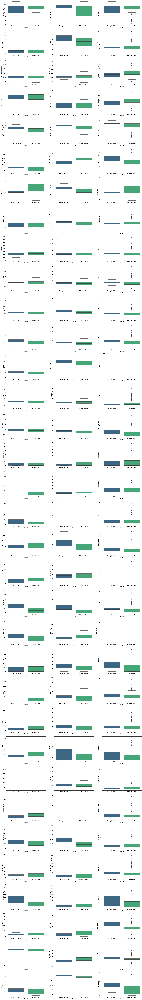

In [96]:
fig, axes = plt.subplots(34, 3, figsize=(40, 300))

plt.rcParams['font.size'] = '20'

for r in range(34):
    for c in range(3):
        sns.boxplot(ax=axes[r, c], data=data, y=numerical[r][c], x ='TARGET', palette='viridis')
        #axes[r, c].rc('font', {'font.size': 20})
        #axes[r, c].legend(loc='upper right', fontsize = 20.0)
        axes[r, c].set_ylabel(numerical[r][c], fontsize = 20.0)
        axes[r, c].set_xlabel('Target', fontsize = 20.0)